In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import h5py
import scib
import scipy.io as sio

In [2]:
sc.settings.verbosity = 1             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=200, frameon=False, figsize=(3,3), facecolor='white')

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.2.0
asttokens           NA
backcall            0.2.0
cffi                1.15.1
colorama            0.4.6
comm                0.1.3
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.2
debugpy             1.6.7
decorator           5.1.0
deprecated          1.2.12
executing           1.2.0
google              NA
h5py                3.7.0
igraph              0.10.2
ipykernel           6.23.1
jedi                0.18.2
joblib              1.0.1
kiwisolver          1.3.1
leidenalg           0.9.0
llvmlite            0.39.1
matplotlib          3.4.2
matplotlib_inline   0.1.6
mpl_toolkits        NA
natsort             8.2.0
numba               0.56.3
numpy               1.22.4
packaging           21.3
pandas              1.5.1
parso               0.8.3
patsy               0.5.3
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      3.0.38
psutil              5.

/home/suyanchi/program/miniconda/envs/dab/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [3]:
dataset_name = ["cell_lines", "panc8_rm", "uc3", "crc"]

In [4]:
i=3
re=0.1

In [5]:
# load raw data
adata_raw = sc.read_h5ad('/home/suyanchi/project/dab/data/batch/'+dataset_name[i]+'.h5ad')
adata_raw

AnnData object with n_obs × n_vars = 54285 × 12667
    obs: 'ClusterID', 'ClusterName', 'Global_Cluster', 'Platform', 'Sample', 'Sub_Cluster', 'Sub_ClusterID', 'Tissue', 'batch'
    var: 'Selected-10X', 'vst_mean-10X', 'vst_variable-10X', 'vst_variance-10X', 'vst_variance_expected-10X', 'vst_variance_standardized-10X', 'Selected-Smart-seq2', 'vst_mean-Smart-seq2', 'vst_variable-Smart-seq2', 'vst_variance-Smart-seq2', 'vst_variance_expected-Smart-seq2', 'vst_variance_standardized-Smart-seq2'
    uns: 'ClusterName_colors', 'Global_Cluster_colors', 'Platform_colors', 'Sample_colors', 'Sub_Cluster_colors', 'Tissue_colors', 'batch_colors'
    obsm: 'pca_cell_embeddings', 'umap_cell_embeddings'
    layers: 'norm_data', 'scale_data'

In [6]:
dat_sc = sio.loadmat('/home/suyanchi/project/dab/results/'+dataset_name[i]+'.mat')
dat_sc['re']

array([[9.2109941e-02, 1.3856226e-01, 1.1260687e-01, ..., 1.3442178e+00,
        2.9312834e-01, 1.4648801e+00],
       [0.0000000e+00, 2.6134767e-02, 3.1412020e-02, ..., 1.2995087e+00,
        0.0000000e+00, 1.6488607e+00],
       [9.6363667e-03, 3.0464632e-03, 0.0000000e+00, ..., 1.4130627e+00,
        0.0000000e+00, 1.6915126e+00],
       ...,
       [8.0208373e-01, 9.9600202e-01, 9.1329247e-01, ..., 6.5456166e+00,
        4.3669128e+00, 7.7815671e+00],
       [2.2244638e-01, 2.8885549e-01, 2.2646689e-01, ..., 4.3267527e+00,
        2.6320522e+00, 4.8359566e+00],
       [1.8292218e+00, 2.2043746e+00, 2.0806403e+00, ..., 7.4023762e+00,
        5.2661152e+00, 8.7979269e+00]], dtype=float32)

In [7]:
adata_raw.X = dat_sc['re'].T

In [8]:
sc.pp.pca(adata_raw)
sc.pp.neighbors(adata_raw)
sc.tl.umap(adata_raw)

/home/suyanchi/program/miniconda/envs/dab/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


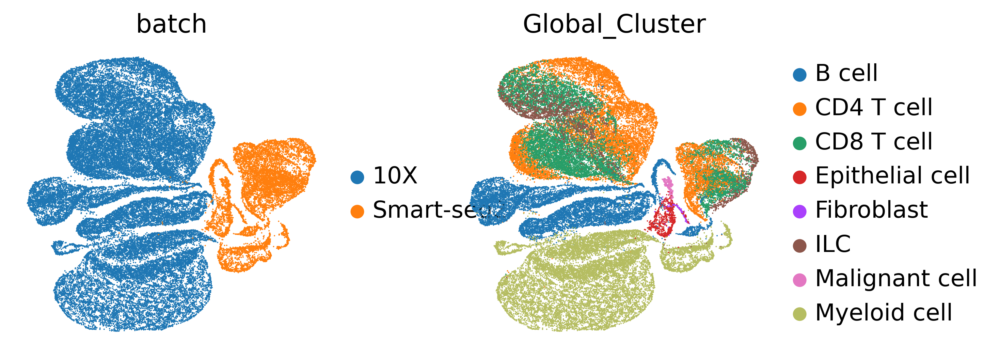

In [10]:
sc.pl.umap(adata_raw, color=['batch', 'Global_Cluster'], palette=sc.pl.palettes.vega_20_scanpy)

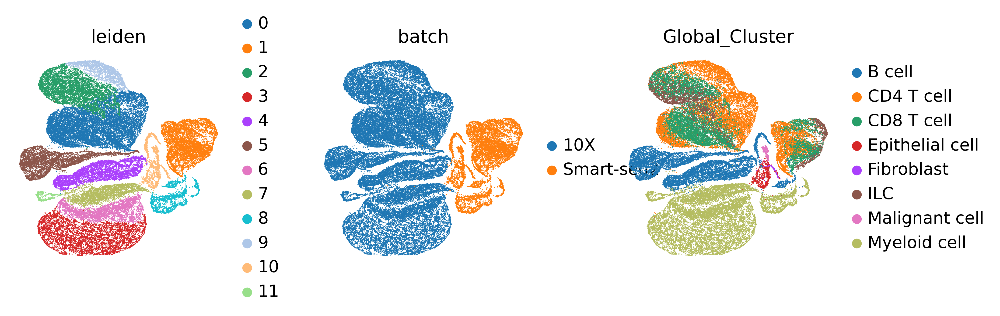

In [11]:
sc.tl.leiden(adata_raw, resolution=re)
sc.pl.umap(adata_raw, color=['leiden', 'batch', 'Global_Cluster'])

In [12]:
ari = scib.metrics.ari(adata_raw, group1 = 'leiden', group2='Global_Cluster')
nmi = scib.metrics.nmi(adata_raw, group1 = 'leiden', group2='Global_Cluster')
asw = scib.metrics.silhouette(adata_raw, label_key='Global_Cluster', embed='X_pca')
b_asw = scib.metrics.silhouette_batch(adata_raw, batch_key='batch', label_key='Global_Cluster', embed='X_pca', verbose=False)
print('ARI: {:.4f}, NMI: {:.4f}, ASW: {:.4f}, batch-ASW: {:.4f}'.format(ari, nmi, asw, b_asw))

/tmp/ipykernel_18717/2770285078.py:1: DeprecationWarning: Keyword argument 'group1' has been deprecated in favour of 'cluster_key'. 'group1' will be removed in a future version.
  ari = scib.metrics.ari(adata_raw, group1 = 'leiden', group2='Global_Cluster')
/tmp/ipykernel_18717/2770285078.py:1: DeprecationWarning: Keyword argument 'group2' has been deprecated in favour of 'label_key'. 'group2' will be removed in a future version.
  ari = scib.metrics.ari(adata_raw, group1 = 'leiden', group2='Global_Cluster')
/tmp/ipykernel_18717/2770285078.py:2: DeprecationWarning: Keyword argument 'group1' has been deprecated in favour of 'cluster_key'. 'group1' will be removed in a future version.
  nmi = scib.metrics.nmi(adata_raw, group1 = 'leiden', group2='Global_Cluster')
/tmp/ipykernel_18717/2770285078.py:2: DeprecationWarning: Keyword argument 'group2' has been deprecated in favour of 'label_key'. 'group2' will be removed in a future version.
  nmi = scib.metrics.nmi(adata_raw, group1 = 'leiden

ARI: 0.3442, NMI: 0.5706, ASW: 0.4477, batch-ASW: 0.1476


In [13]:
%%time
sc.external.pp.bbknn(adata_raw, batch_key='batch')
# adata_raw = sc.external.pp.mnn_correct(adata_raw, batch_key='batch')
adata_raw

CPU times: user 6.38 s, sys: 688 ms, total: 7.07 s
Wall time: 5.91 s


AnnData object with n_obs × n_vars = 54285 × 12667
    obs: 'ClusterID', 'ClusterName', 'Global_Cluster', 'Platform', 'Sample', 'Sub_Cluster', 'Sub_ClusterID', 'Tissue', 'batch', 'leiden'
    var: 'Selected-10X', 'vst_mean-10X', 'vst_variable-10X', 'vst_variance-10X', 'vst_variance_expected-10X', 'vst_variance_standardized-10X', 'Selected-Smart-seq2', 'vst_mean-Smart-seq2', 'vst_variable-Smart-seq2', 'vst_variance-Smart-seq2', 'vst_variance_expected-Smart-seq2', 'vst_variance_standardized-Smart-seq2'
    uns: 'ClusterName_colors', 'Global_Cluster_colors', 'Platform_colors', 'Sample_colors', 'Sub_Cluster_colors', 'Tissue_colors', 'batch_colors', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'pca_cell_embeddings', 'umap_cell_embeddings', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'norm_data', 'scale_data'
    obsp: 'distances', 'connectivities'

In [14]:
sc.tl.umap(adata_raw)

/home/suyanchi/.local/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:245: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


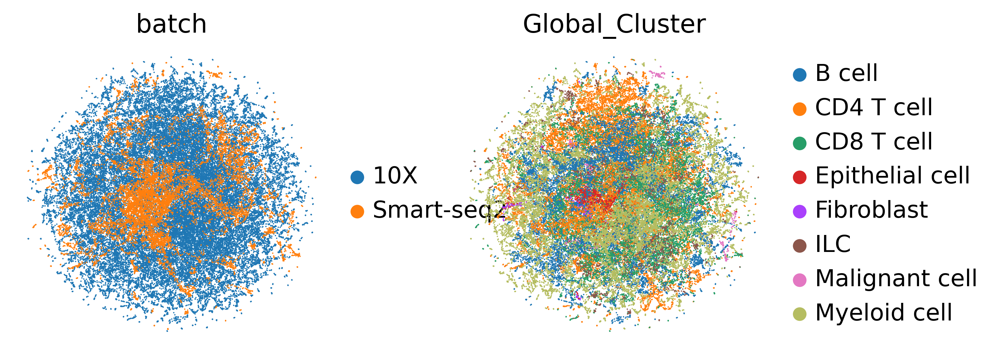

In [15]:
sc.pl.umap(adata_raw, color=['batch', 'Global_Cluster'])

In [16]:
sc.tl.leiden(adata_raw, resolution=re)

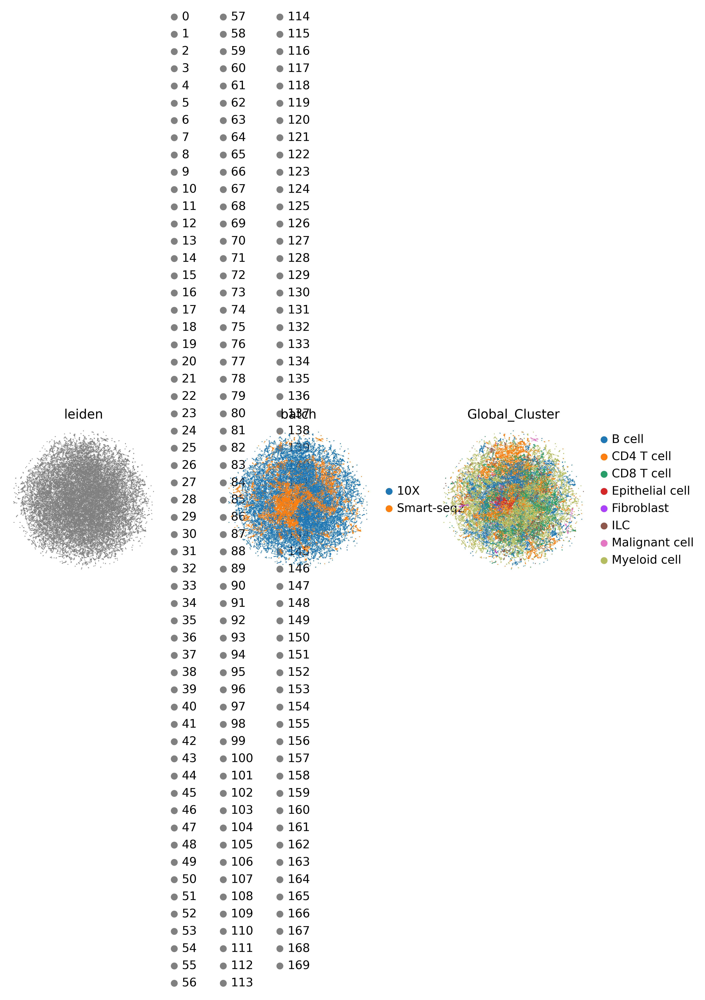

In [17]:
sc.pl.umap(adata_raw, color=['leiden', 'batch', 'Global_Cluster'])

In [18]:
ari = scib.metrics.ari(adata_raw, group1 = 'leiden', group2='Global_Cluster')
nmi = scib.metrics.nmi(adata_raw, group1 = 'leiden', group2='Global_Cluster')
asw = scib.metrics.silhouette(adata_raw, label_key='Global_Cluster', embed='X_pca')
b_asw = scib.metrics.silhouette_batch(adata_raw, batch_key='batch', label_key='Global_Cluster', embed='X_pca', verbose=False)
print('ARI: {:.4f}, NMI: {:.4f}, ASW: {:.4f}, batch-ASW: {:.4f}'.format(ari, nmi, asw, b_asw))

/tmp/ipykernel_18717/2770285078.py:1: DeprecationWarning: Keyword argument 'group1' has been deprecated in favour of 'cluster_key'. 'group1' will be removed in a future version.
  ari = scib.metrics.ari(adata_raw, group1 = 'leiden', group2='Global_Cluster')
/tmp/ipykernel_18717/2770285078.py:1: DeprecationWarning: Keyword argument 'group2' has been deprecated in favour of 'label_key'. 'group2' will be removed in a future version.
  ari = scib.metrics.ari(adata_raw, group1 = 'leiden', group2='Global_Cluster')
/tmp/ipykernel_18717/2770285078.py:2: DeprecationWarning: Keyword argument 'group1' has been deprecated in favour of 'cluster_key'. 'group1' will be removed in a future version.
  nmi = scib.metrics.nmi(adata_raw, group1 = 'leiden', group2='Global_Cluster')
/tmp/ipykernel_18717/2770285078.py:2: DeprecationWarning: Keyword argument 'group2' has been deprecated in favour of 'label_key'. 'group2' will be removed in a future version.
  nmi = scib.metrics.nmi(adata_raw, group1 = 'leiden

ARI: 0.1798, NMI: 0.4557, ASW: 0.4477, batch-ASW: 0.1476


In [19]:
# df = pd.read_csv('/home/suyanchi/project/dab/results/batch/'+dataset_name[i]+'_metric.csv', header=0, index_col=0)
# df

In [20]:
# # combineing results 
# df1 = pd.DataFrame({'Methods': ['bis'],
#                    'ARI': [ari],
#                    "NMI": [nmi],
#                    "ASW": [asw],
#                    "b_ASW": [b_asw]})
# df = pd.concat([df, df1])
# df

In [21]:
# adata_raw.write('/home/suyanchi/project/dab/results/batch/'+dataset_name[i]+'_bis.h5ad')